<a href="https://colab.research.google.com/github/mal-cul1830/reponame/blob/master/keyframe.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install -q kaggle
from google.colab import files
files.upload()

Saving kaggle (2).json to kaggle (2).json


{'kaggle (2).json': b'{"username":"malavikaunnikrishnan","key":"d776b46f05cd9bfdb3e4bc2d383deb95"}'}

In [ ]:
!mkdir ~/.kaggle

In [ ]:
!cp "kaggle.json" ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/"kaggle.json"

In [ ]:
 ! kaggle datasets list

ref                                                         title                                              size  lastUpdated          downloadCount  
----------------------------------------------------------  ------------------------------------------------  -----  -------------------  -------------  
gpreda/reddit-vaccine-myths                                 Reddit Vaccine Myths                              227KB  2021-04-27 07:28:41           3794  
crowww/a-large-scale-fish-dataset                           A Large Scale Fish Dataset                          3GB  2021-02-17 16:10:44           2207  
promptcloud/careerbuilder-job-listing-2020                  Careerbuilder Job Listing 2020                     42MB  2021-03-05 06:59:52            471  
dhruvildave/wikibooks-dataset                               Wikibooks Dataset                                   1GB  2021-02-18 10:08:27           1393  
mathurinache/twitter-edge-nodes                             Twitter Edge Nod

In [ ]:
!kaggle datasets download -d ananduthaman/self-driving-car-on-indian-roads

100% 2.19G/2.20G [00:20<00:00, 97.5MB/s]
100% 2.20G/2.20G [00:20<00:00, 114MB/s] 


In [ ]:
import zipfile 
with zipfile.ZipFile("/content/self-driving-car-on-indian-roads.zip","r") as z:
  z.extractall(".")



End of Data import section


In [ ]:
global filenames, path
path = '/content/indian_dataset/indian_dataset/'

In [ ]:
import os 
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image, ImageEnhance
import cv2

In [ ]:
filenames = os.listdir(path)
filenames.sort()

In [ ]:
def get_images(n, start):
    global filenames, path
    
    i = start; 
    images = []
    while i < n + start:
        images.append(cv2.cvtColor(cv2.imread(path + filenames[i]), cv2.COLOR_BGR2RGB))
        i+=1
    return images 

In [ ]:
def get_hist(img):
    hist = cv2.calcHist([img],[0,1,2],None,[8,8,8],[0,256,0,256,0,256]) 
    hist = cv2.normalize(hist, None).flatten()
    
    return hist

In [ ]:
def comp(images, start, length, width):
  i = 0
  diff = []
  images = np.array(images)[:,start:start + length,start:start + width,:]
  while i < len(images) - 1:
    h1 = get_hist(equ(images[i]))
    h2 = get_hist(equ(images[i+1]))

    d = cv2.compareHist(h1, h2, cv2.HISTCMP_KL_DIV)
    print(d)
    diff.append(d)
    i+=1

In [ ]:
def equ(img):
  image = img.copy()

  for i in range(3):
    image[:,:,i] = cv2.equalizeHist(image[:,:,i])
  return image

In [ ]:
def euc(h1, h2):
  h = []
  for i,j in zip(h1, h2):
    h.append(i - j)
  return h

In [ ]:
def mse(im1, im2):
  return np.sqrt(np.sum(np.square(np.subtract(im1, im2))))

In [ ]:
images = get_images(100, 500)

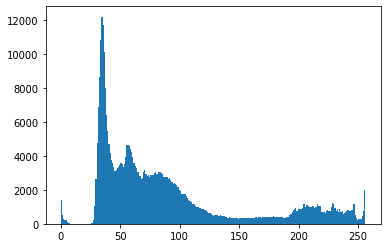

In [ ]:
plt.hist(images[99].ravel(),256,[0,256]); 
plt.show()

In [ ]:
hsv = cv2.cvtColor(images[0], cv2.COLOR_BGR2HSV)

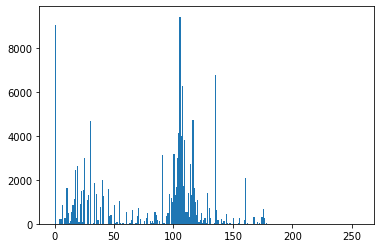

In [ ]:
plt.hist(hsv[:,:,0].ravel(),256,[0,256]); 
plt.show()

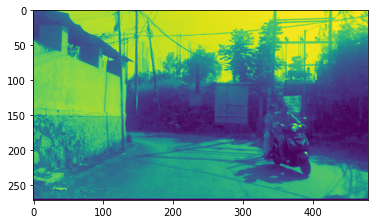

In [ ]:
plt.imshow(cv2.equalizeHist(hsv[:,:,2]))

In [ ]:
i = 0 
while i < len(diff):
  if(diff[i] > val):
    plt.imshow(equ(images[i]))
    plt.show()
    print(diff[i])
  i+=1

In [ ]:
val = np.mean(diff) + np.sqrt(np.var(diff))

/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [ ]:
def hsv(img):
  return cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

In [ ]:
plt.imshow(equ(images[99]), 'gray')

NameError: ignored

In [ ]:
METHODS = {
    cv2.HISTCMP_CORREL
    ,cv2.HISTCMP_CHISQR
,cv2.HISTCMP_CHISQR_ALT
,cv2.HISTCMP_INTERSECT
,cv2.HISTCMP_BHATTACHARYYA
,cv2.HISTCMP_HELLINGER
,cv2.HISTCMP_KL_DIV
}

In [ ]:
def sector(im1, im2, method, n = 16, display = False):

  height, length = im1.shape[:2]
  l = int(np.sqrt(n))
  hn = height//l
  ln = length//l
  hi, li , s= 0,0,0
  s = []
  k = 1
  while hi < height:
    li = 0
    while li < length:
      h1 = get_hist(equ(im1[hi:hi+hn, li:li+ln]))
      h2 = get_hist(equ(im2[hi:hi+hn, li:li+ln]))
      d = cv2.compareHist(h1, h2, method)
      if display:
        print(k)
        k+=1
        plt.imshow(np.hstack((equ(im1[hi:hi+hn, li:li+ln]),equ(im2[hi:hi+hn, li:li+ln]))))
        plt.show()
        print(d)
      s.append(d)
      li+=ln
    hi+=hn

  s.sort()

  return np.average(s[:6])


1


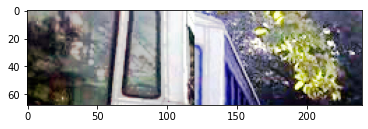

0.754160477359305
2


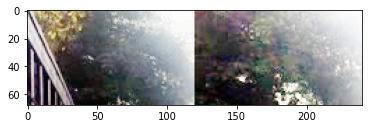

0.9513018420667437
3


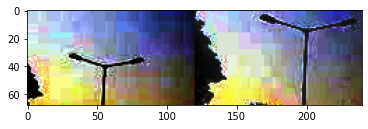

0.573572376679398
4


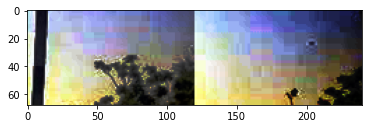

0.6635068664355672
5


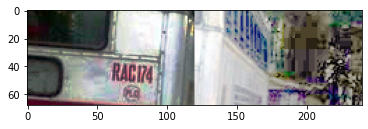

0.77414232610386
6


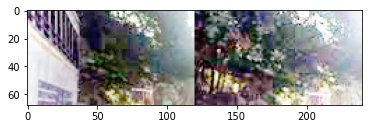

0.8952281946183357
7


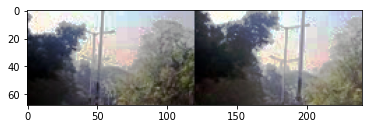

0.9656449323840806
8


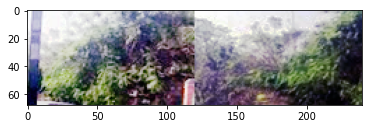

0.9429184474157744
9


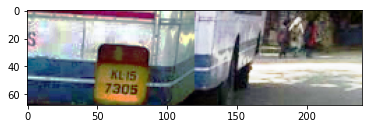

0.6358820468869202
10


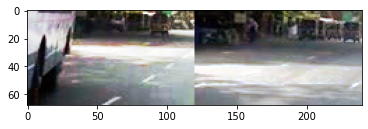

0.9649246032000404
11


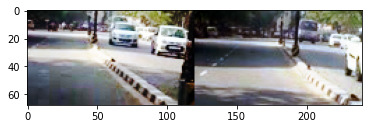

0.9648334324047441
12


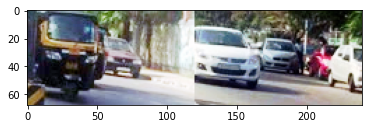

0.9493380995642623
13


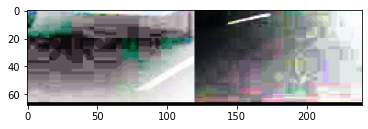

0.8946974671217097
14


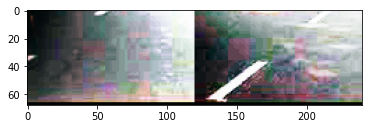

0.8086202785026761
15


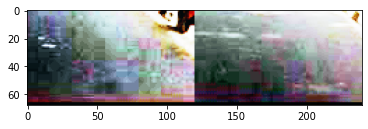

0.7863762105820638
16


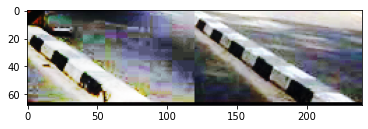

0.8825816077873868
1


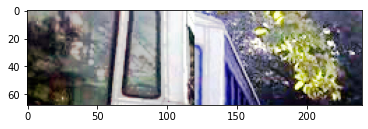

20.485827079391488
2


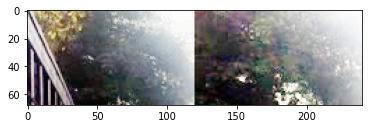

2.666636671571213
3


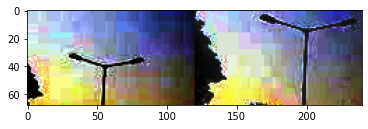

22.342958136042586
4


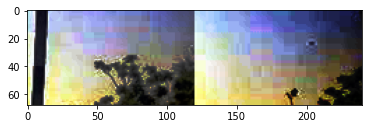

13.265279682911332
5


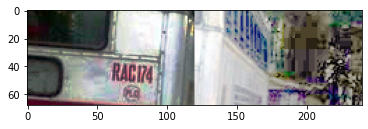

12.61003481737631
6


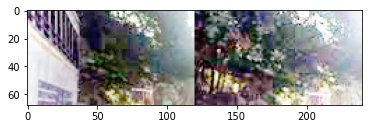

4.868858020865451
7


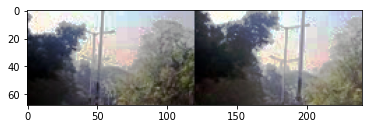

1.261407524649193
8


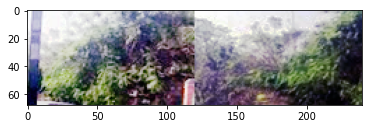

1.8006589407737086
9


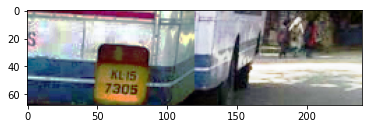

17.14912060921572
10


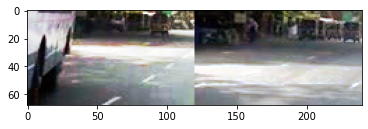

1.0810822319963735
11


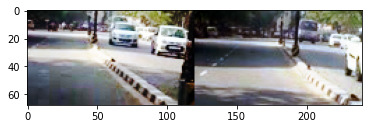

0.9134669516561161
12


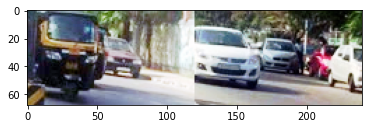

3.112516793012629
13


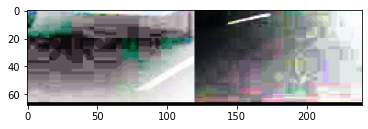

15.408743479375763
14


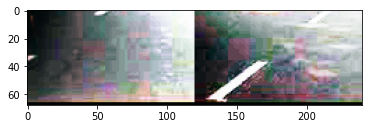

40.38452221279772
15


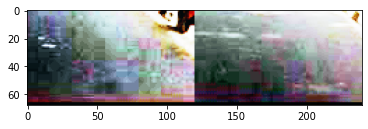

4.067736266943222
16


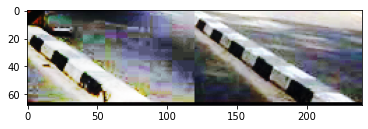

5.355699292107545
1


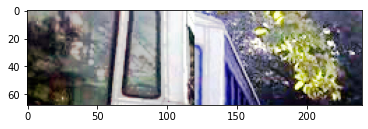

2.5501108691096306
2


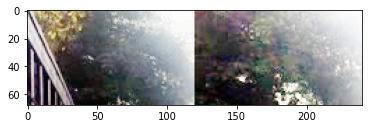

3.25540881298366
3


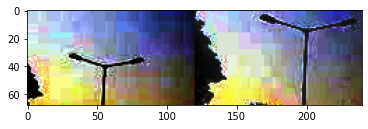

3.2225250041810796
4


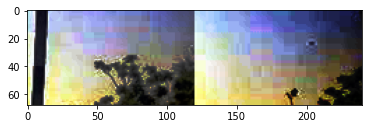

3.375014692544937
5


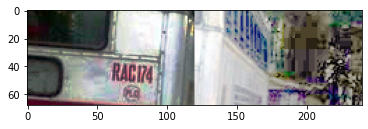

2.4742024377337657
6


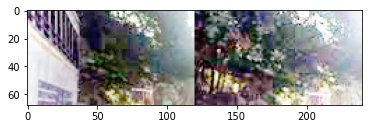

3.9242978006368503
7


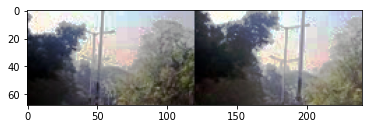

3.609664276591502
8


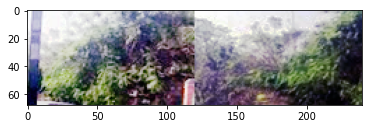

3.5897306049009785
9


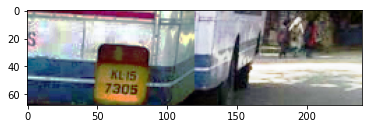

2.6396122758160345
10


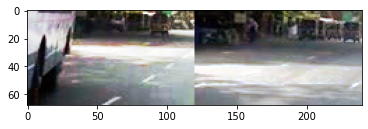

3.417823269730434
11


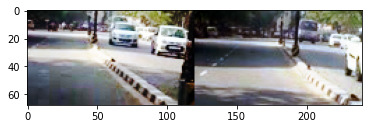

3.7866333479760215
12


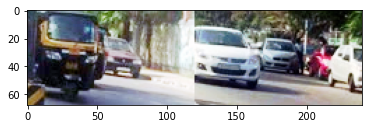

3.9541008923552
13


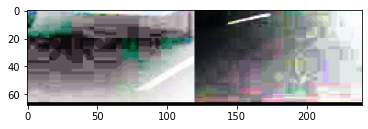

2.3889250766369514
14


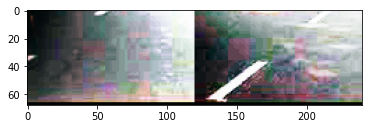

2.898864427465014
15


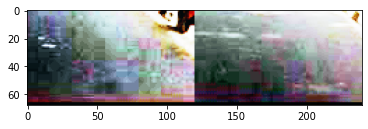

3.3612543726339936
16


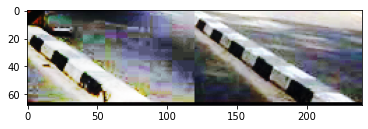

3.216451057116501
1


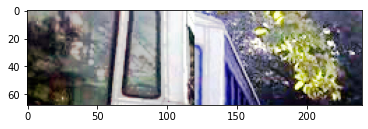

0.48366660794592703
2


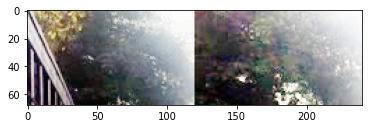

0.27341599809560435
3


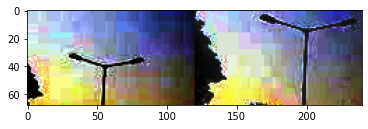

0.5409800956975652
4


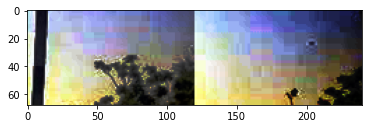

0.5074007325169757
5


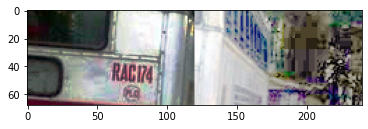

0.42860319109072803
6


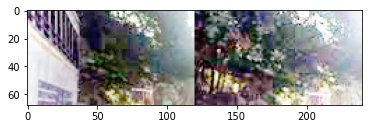

0.27522563594033345
7


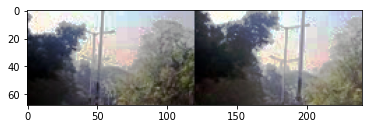

0.18513541649814505
8


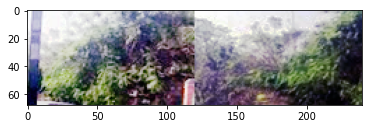

0.2705877106440649
9


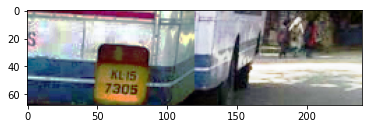

0.5226873583753855
10


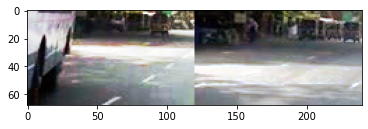

0.19857193367664835
11


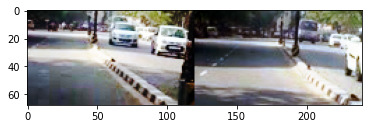

0.18842106284480659
12


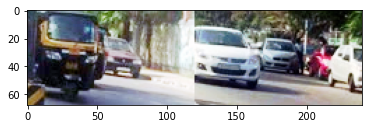

0.26086988719775955
13


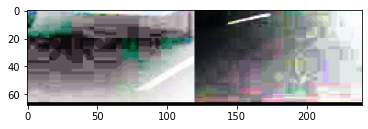

0.4399405466160932
14


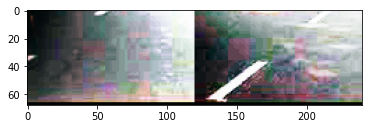

0.4015655865488945
15


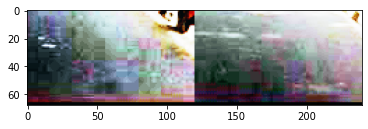

0.4605280488194653
16


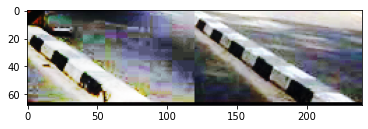

0.3652862092679539
1


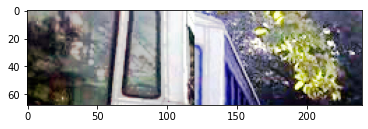

6.157109942350849
2


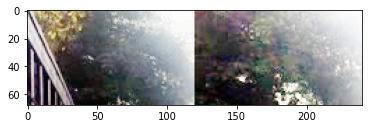

1.929462644141782
3


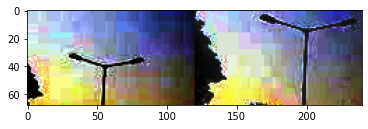

10.337171904946544
4


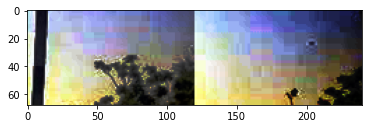

8.452813849448587
5


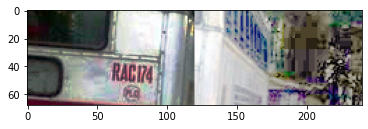

4.35716152535738
6


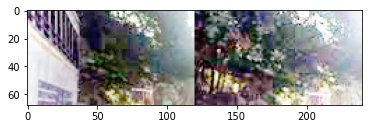

2.5890893215590736
7


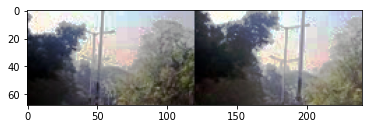

0.9517785065515729
8


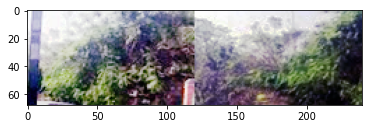

2.216995745808051
9


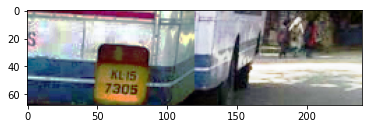

7.998121659321674
10


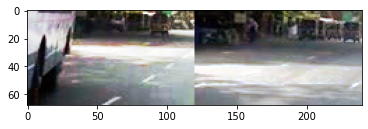

1.0444585910378386
11


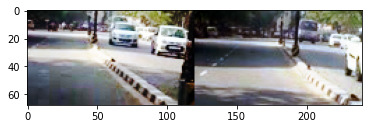

1.0048830458652578
12


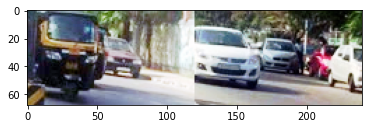

1.9929442265764883
13


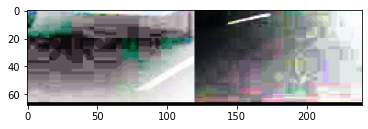

3.22489404752873
14


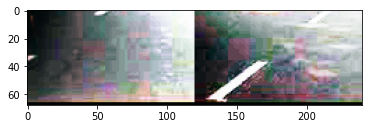

3.938012326896533
15


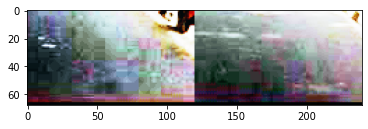

5.574170640682947
16


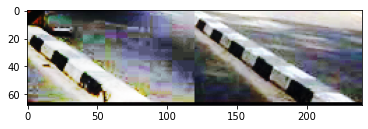

3.1807963810930913
1


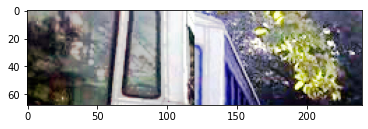

2.964823277644106
2


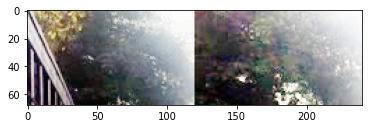

4.622988422301413
3


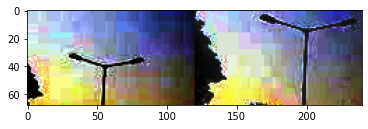

31.459714145026634
4


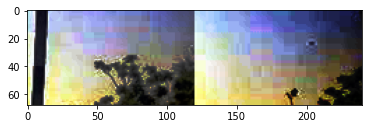

11.543194982804662
5


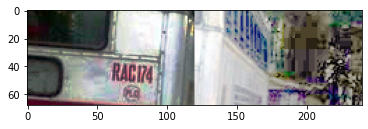

8.657865570615597
6


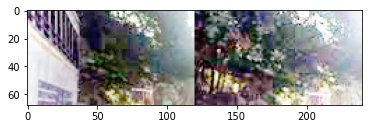

1.8510012528404192
7


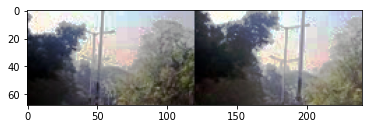

1.4814664642177355
8


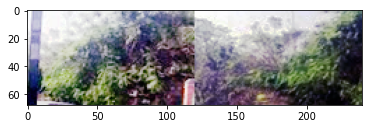

5.862234013452251
9


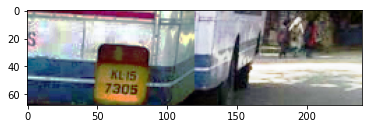

26.270899567418034
10


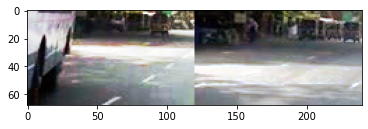

1.8524251870231092
11


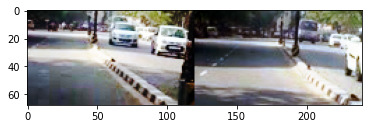

1.0147449987008292
12


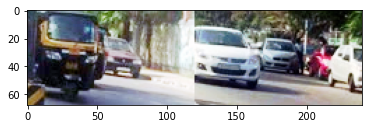

3.9992247171112836
13


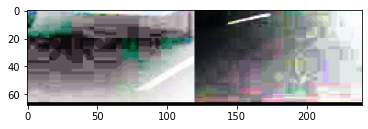

9.497951852937907
14


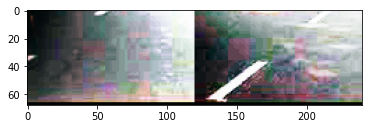

5.438150375138985
15


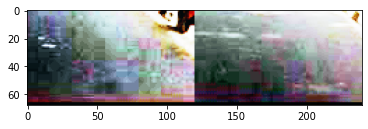

18.5890663082888
16


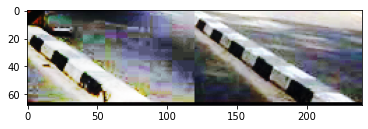

8.238568489251357


In [ ]:
sfull = []

for method in METHODS:
  sfull.append(sector(images[0], images[50], method, 16, True))

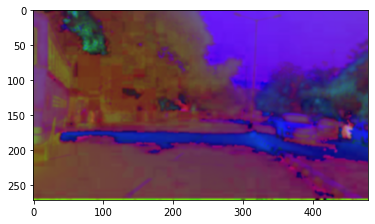

In [ ]:
plt.imshow(cv2.GaussianBlur(hsv(images[50]), (5,5), 0))

In [94]:
images = get_images(20000, 0)

0.63 0.632678176619302
nan : THRESH 

0.62 0.6201870007796132
0.52 : THRESH 

0.66 0.6551363934290966
0.51 : THRESH 

0.62 0.6249298066976475
0.5 : THRESH 

0.56 0.5571337943184452
0.5 : THRESH 

0.55 0.5475836322583975
0.48 : THRESH 

0.51 0.514205778387915
0.46 : THRESH 

0.5 0.49800556108690147
0.45 : THRESH 

0.48 0.4788848044165827
0.44 : THRESH 

0.49 0.48629087354407785
0.42 : THRESH 

0.5 0.49850249002083996
0.41 : THRESH 

0.5 0.504940598040352
0.42 : THRESH 

0.44 0.4371907065066852
0.43 : THRESH 

0.45 0.44724222502268235
0.42 : THRESH 

0.36 0.3606863117997103
0.42 : THRESH 



/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3373: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.7/dist-packages/numpy/core/fromnumeric.py:3622: RuntimeWarning: Degrees of freedom <= 0 for slice
  **kwargs)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/usr/local/lib/python3.7/dist-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


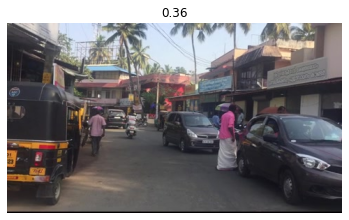

0.81 0.8136709635369533
0.39 : THRESH 

0.71 0.7138926316654093
0.33 : THRESH 

0.68 0.6781638048308581
0.33 : THRESH 

0.7 0.7033351803767652
0.33 : THRESH 

0.66 0.6550775480262735
0.34 : THRESH 

0.55 0.5547072786789107
0.35 : THRESH 

0.48 0.4777049404737057
0.37 : THRESH 

0.5 0.5031684054967155
0.37 : THRESH 

0.47 0.47219933618471394
0.41 : THRESH 

0.41 0.4082989575819194
0.4 : THRESH 

0.37 0.3668883398244133
0.38 : THRESH 



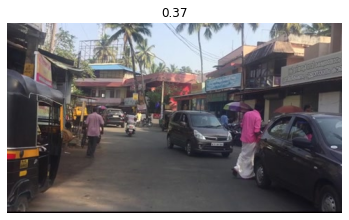

0.74 0.7429043196426582
0.35 : THRESH 

0.62 0.6174392860447154
0.35 : THRESH 

0.58 0.5766903766387319
0.35 : THRESH 

0.45 0.44685776208429173
0.35 : THRESH 

0.37 0.3678925609656742
0.34 : THRESH 

0.28 0.2809488800452605
0.33 : THRESH 



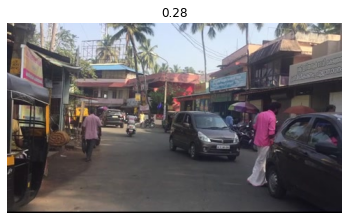

0.74 0.7410711100916488
0.29 : THRESH 

0.64 0.6441851005950202
0.29 : THRESH 

0.67 0.6650072227597027
0.32 : THRESH 

0.48 0.47617453379531516
0.32 : THRESH 

0.49 0.4922639578655838
0.32 : THRESH 

0.42 0.4168669821136761
0.31 : THRESH 

0.44 0.4360895331916632
0.31 : THRESH 

0.36 0.35784326021349383
0.32 : THRESH 

0.32 0.31993866048596514
0.34 : THRESH 



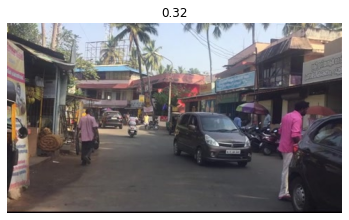

0.8 0.7992043006081255
0.32 : THRESH 

0.68 0.6785577444179157
0.3 : THRESH 

0.66 0.6622368554834204
0.3 : THRESH 

0.47 0.4705783453950067
0.3 : THRESH 

0.44 0.4384304702767538
0.3 : THRESH 

0.45 0.45292997280658337
0.3 : THRESH 

0.35 0.34842608802433195
0.3 : THRESH 

0.35 0.3539319635611391
0.3 : THRESH 

0.32 0.32477424422434475
0.31 : THRESH 

0.34 0.3363896837764229
0.3 : THRESH 

0.35 0.34834197538751005
0.31 : THRESH 

0.27 0.26706770958954584
0.34 : THRESH 



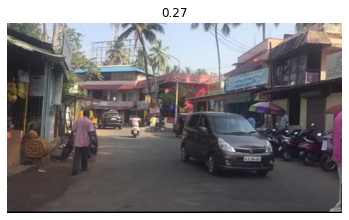

0.7 0.7045874590120009
0.32 : THRESH 

0.54 0.5413695956987409
0.27 : THRESH 

0.43 0.43113030961582166
0.27 : THRESH 

0.41 0.4144944787877359
0.27 : THRESH 

0.45 0.4535842500521852
0.28 : THRESH 

0.45 0.4539396665601789
0.29 : THRESH 

0.43 0.43098394087251496
0.31 : THRESH 

0.29 0.29187413192530537
0.32 : THRESH 



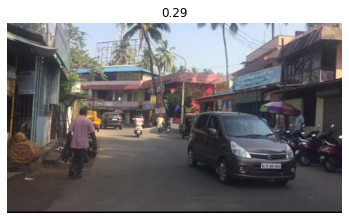

0.71 0.7070406727947219
0.32 : THRESH 

0.61 0.6108662429483736
0.32 : THRESH 

0.59 0.5887556254632933
0.32 : THRESH 

0.51 0.5099416920484025
0.32 : THRESH 

0.52 0.5224912092546524
0.33 : THRESH 

0.39 0.38857904519416825
0.34 : THRESH 

0.4 0.399118954991208
0.33 : THRESH 

0.33 0.32609969888703244
0.32 : THRESH 

0.32 0.31888930811765714
0.33 : THRESH 



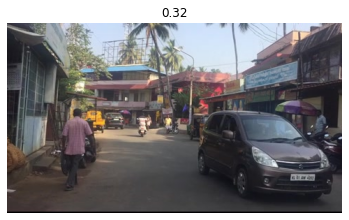

0.7 0.6968952474265863
0.32 : THRESH 

0.5 0.5031874167547525
0.31 : THRESH 

0.53 0.5347410820074255
0.31 : THRESH 

0.46 0.46045151481690993
0.31 : THRESH 

0.44 0.43846120673609423
0.31 : THRESH 

0.4 0.3971490792753564
0.32 : THRESH 

0.34 0.34337234440862646
0.32 : THRESH 

0.35 0.3491166025910371
0.32 : THRESH 

0.29 0.28761377533568117
0.32 : THRESH 



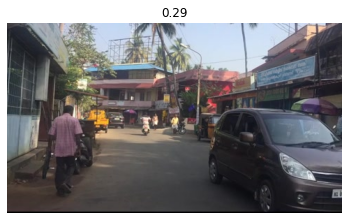

0.74 0.7372225577779418
0.33 : THRESH 

0.61 0.6068458664505506
0.29 : THRESH 

0.58 0.5774579560541908
0.29 : THRESH 

0.47 0.47276787207399695
0.29 : THRESH 

0.37 0.3662797051207916
0.29 : THRESH 

0.37 0.3666302967513921
0.29 : THRESH 

0.34 0.34198842615799524
0.29 : THRESH 

0.3 0.3044848475396533
0.29 : THRESH 

0.22 0.22107694842506445
0.29 : THRESH 



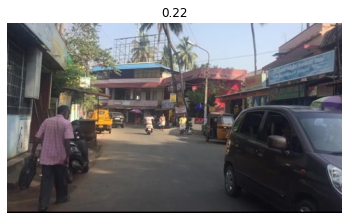

0.71 0.7139141052592347
0.28 : THRESH 

0.52 0.5154049674121921
0.26 : THRESH 

0.43 0.43001636748734545
0.26 : THRESH 

0.39 0.3863093600826312
0.26 : THRESH 

0.34 0.3373462224933335
0.26 : THRESH 

0.32 0.31602201752467374
0.26 : THRESH 

0.29 0.29098260548383553
0.26 : THRESH 

0.26 0.2602993499527643
0.26 : THRESH 

0.25 0.24733920639889898
0.27 : THRESH 



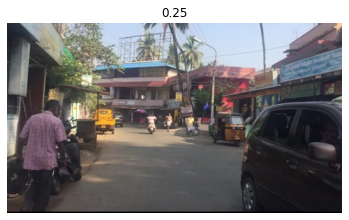

0.75 0.747479477698909
0.29 : THRESH 

0.57 0.5676097316835494
0.24 : THRESH 

0.5 0.5039748799524535
0.23 : THRESH 

0.4 0.4040326640636723
0.24 : THRESH 

0.4 0.39736236952195086
0.24 : THRESH 

0.34 0.3402014264077022
0.25 : THRESH 

0.32 0.3163656966554224
0.26 : THRESH 

0.28 0.28340716515265385
0.27 : THRESH 

0.25 0.25471372129893327
0.28 : THRESH 



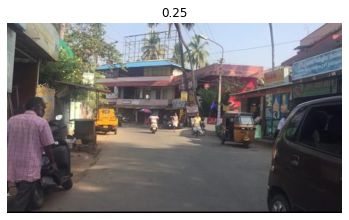

0.63 0.6297231704585039
0.29 : THRESH 

0.55 0.5482079499362994
0.28 : THRESH 

0.49 0.4853818764800679
0.27 : THRESH 

0.42 0.41793002344608216
0.28 : THRESH 

0.36 0.36162838652231954
0.28 : THRESH 

0.31 0.3095858347922194
0.28 : THRESH 

0.26 0.25769772352236725
0.28 : THRESH 



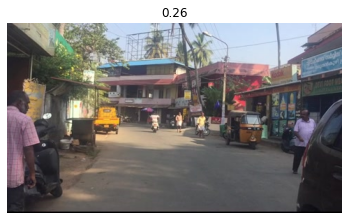

0.68 0.6824698624640825
0.27 : THRESH 

0.63 0.6293947868174911
0.29 : THRESH 

0.45 0.4490741243991976
0.29 : THRESH 

0.34 0.33979393414503223
0.29 : THRESH 

0.3 0.2961589927107972
0.27 : THRESH 

0.28 0.280797298490942
0.26 : THRESH 

0.25 0.25011591946832307
0.25 : THRESH 

0.22 0.21900724327498292
0.24 : THRESH 



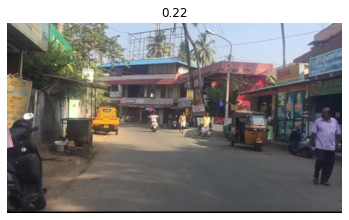

0.67 0.6717375509775657
0.23 : THRESH 

0.58 0.5819173679116333
0.23 : THRESH 

0.61 0.6144266738676473
0.24 : THRESH 

0.63 0.6288704361348998
0.23 : THRESH 

0.47 0.46806249445710796
0.24 : THRESH 

0.42 0.41955564833357206
0.26 : THRESH 

0.4 0.4026925768777456
0.28 : THRESH 

0.35 0.3458421922268167
0.31 : THRESH 

0.35 0.350691294545921
0.35 : THRESH 

0.26 0.26462285015948933
0.33 : THRESH 



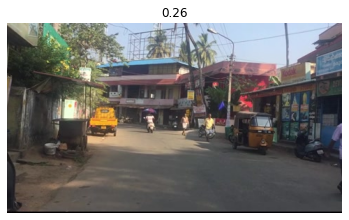

0.77 0.766924824321458
0.3 : THRESH 

0.68 0.6844761154845167
0.27 : THRESH 

0.45 0.4519589783513475
0.27 : THRESH 

0.37 0.369479955549473
0.27 : THRESH 

0.4 0.39583285732420226
0.26 : THRESH 

0.31 0.30872562118721114
0.26 : THRESH 

0.33 0.3290669612854806
0.25 : THRESH 

0.35 0.3470276674584268
0.25 : THRESH 

0.35 0.3489462333419448
0.27 : THRESH 

0.33 0.32629562010652163
0.29 : THRESH 

0.33 0.3284255849434099
0.34 : THRESH 



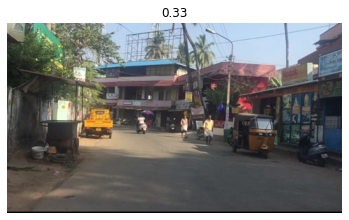

0.7 0.7025079636320242
0.35 : THRESH 

0.63 0.6302925241907157
0.27 : THRESH 

0.53 0.5314368377082153
0.26 : THRESH 

0.47 0.4719280273587208
0.28 : THRESH 

0.64 0.6394807726067128
0.29 : THRESH 

0.52 0.5204268587968878
0.31 : THRESH 

0.5 0.5002197341399587
0.33 : THRESH 

0.51 0.5128439737429549
0.36 : THRESH 

0.51 0.5083269480513888
0.4 : THRESH 

0.38 0.38425164892209146
0.41 : THRESH 



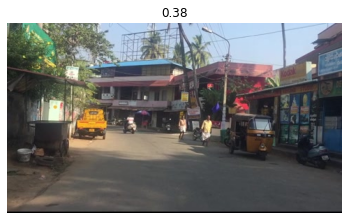

0.64 0.6395693702413116
0.39 : THRESH 

0.46 0.4627086460342557
0.38 : THRESH 

0.55 0.5487420598801876
0.38 : THRESH 

0.48 0.4844822085628606
0.39 : THRESH 

0.38 0.38438542161953787
0.38 : THRESH 

0.4 0.40271801424568787
0.36 : THRESH 

0.42 0.416771556747286
0.35 : THRESH 

0.42 0.4164206853536058
0.35 : THRESH 

0.45 0.4469796180541752
0.35 : THRESH 

0.33 0.3275000901115645
0.37 : THRESH 



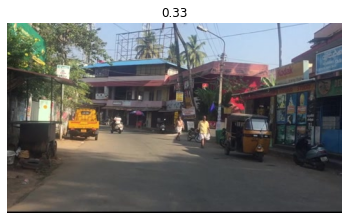

0.88 0.8785266001380344
0.35 : THRESH 

0.61 0.613549324371843
0.27 : THRESH 

0.53 0.5272006491239392
0.28 : THRESH 

0.58 0.5781235449509693
0.29 : THRESH 

0.55 0.5539893272540709
0.3 : THRESH 

0.46 0.4640532892293537
0.32 : THRESH 

0.45 0.45289786631475537
0.32 : THRESH 

0.48 0.4771649992678056
0.32 : THRESH 

0.38 0.38011231666883
0.35 : THRESH 

0.27 0.2729755650366744
0.38 : THRESH 



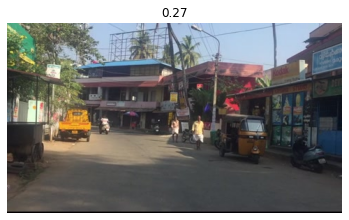

0.57 0.5744156132454112
0.34 : THRESH 

0.48 0.48478283044623355
0.34 : THRESH 

0.53 0.5259419532224775
0.34 : THRESH 

0.5 0.4985594462944876
0.34 : THRESH 

0.46 0.45524291377001247
0.34 : THRESH 

0.48 0.4841459261397923
0.34 : THRESH 

0.41 0.4143274594182573
0.34 : THRESH 

0.4 0.40270071362469034
0.35 : THRESH 

0.36 0.36184122148461056
0.39 : THRESH 



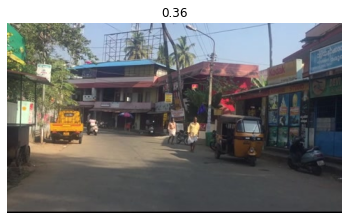

0.79 0.7906818285973077
0.37 : THRESH 

0.7 0.6991909425813582
0.32 : THRESH 

0.63 0.6319868245356696
0.31 : THRESH 

0.56 0.5600621926026115
0.32 : THRESH 

0.55 0.5498820963872779
0.33 : THRESH 

0.41 0.406107126436497
0.33 : THRESH 

0.47 0.4688061907259309
0.33 : THRESH 

0.42 0.41710281904666613
0.34 : THRESH 

0.52 0.5168062814101156
0.36 : THRESH 

0.44 0.44181529400382696
0.37 : THRESH 

0.4 0.3954725928783667
0.38 : THRESH 

0.39 0.39068878790713213
0.38 : THRESH 

0.43 0.4338558192488399
0.37 : THRESH 

0.36 0.362106646981945
0.38 : THRESH 



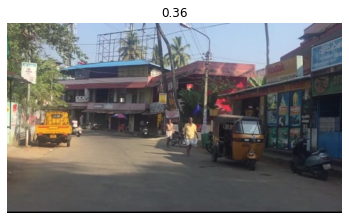

0.66 0.6628344222076238
0.37 : THRESH 

0.63 0.6336546706537735
0.34 : THRESH 

0.65 0.6479168544723902
0.33 : THRESH 

0.64 0.6415308020577185
0.33 : THRESH 

0.57 0.571425101879976
0.33 : THRESH 

0.56 0.5572597753748517
0.35 : THRESH 

0.5 0.5028554361299599
0.38 : THRESH 

0.47 0.468920826968838
0.39 : THRESH 

0.54 0.5439157491281511
0.43 : THRESH 

0.46 0.4571219843877805
0.42 : THRESH 

0.4 0.3965761048948104
0.41 : THRESH 



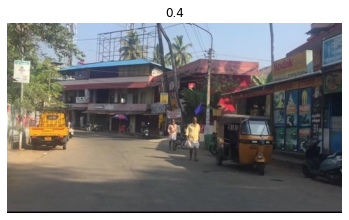

0.8 0.8025245824391855
0.39 : THRESH 

0.73 0.7315899993795925
0.36 : THRESH 

0.64 0.6382460400268238
0.35 : THRESH 

0.64 0.6409174874083453
0.35 : THRESH 

0.64 0.6422087920085676
0.36 : THRESH 

0.57 0.5715180299690222
0.38 : THRESH 

0.6 0.5950971598201866
0.38 : THRESH 

0.45 0.45009241949214296
0.4 : THRESH 

0.43 0.4296937832024388
0.42 : THRESH 

0.42 0.41837814453595296
0.4 : THRESH 

0.38 0.38125174285275804
0.38 : THRESH 

0.34 0.3429080331338131
0.36 : THRESH 



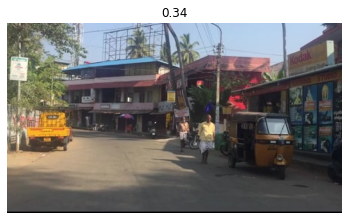

0.8 0.7971345205912536
0.34 : THRESH 

0.6 0.6015154783387318
0.31 : THRESH 

0.66 0.6635950623275114
0.31 : THRESH 

0.61 0.614750996703142
0.31 : THRESH 

0.51 0.510619550895628
0.31 : THRESH 

0.44 0.4365104940968531
0.32 : THRESH 

0.4 0.39824528229694084
0.33 : THRESH 

0.39 0.3895810597079333
0.33 : THRESH 

0.43 0.42933999212455315
0.34 : THRESH 

0.33 0.3317121160166306
0.35 : THRESH 



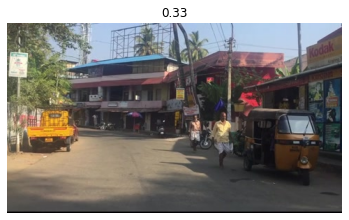

0.64 0.6357888471021781
0.33 : THRESH 

0.71 0.7123597134840721
0.33 : THRESH 

0.55 0.5474444786497529
0.32 : THRESH 

0.6 0.603300401989099
0.32 : THRESH 

0.57 0.5732167424554485
0.32 : THRESH 

0.37 0.3712064152523742
0.34 : THRESH 

0.37 0.3715020793893345
0.34 : THRESH 

0.32 0.3211856547328917
0.33 : THRESH 



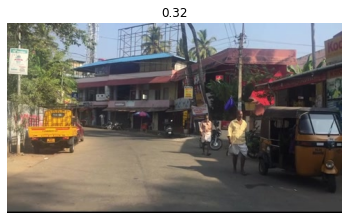

0.79 0.7884578653185151
0.32 : THRESH 

0.7 0.6951870673713735
0.31 : THRESH 

0.63 0.6333530571801532
0.31 : THRESH 

0.66 0.6565297837131351
0.31 : THRESH 

0.6 0.5979702225035292
0.31 : THRESH 

0.49 0.48901821242327453
0.31 : THRESH 

0.44 0.4446607155239743
0.33 : THRESH 

0.42 0.4239455077626924
0.35 : THRESH 

0.32 0.3242737726188203
0.37 : THRESH 



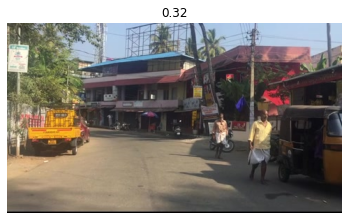

0.78 0.7821786430246663
0.34 : THRESH 

0.62 0.6211462208395907
0.33 : THRESH 

0.58 0.5803338343528057
0.33 : THRESH 

0.51 0.5092217904332825
0.33 : THRESH 

0.41 0.4138792212136271
0.33 : THRESH 

0.38 0.3838962021472588
0.32 : THRESH 

0.33 0.3270063660066076
0.31 : THRESH 

0.22 0.21561181560730813
0.29 : THRESH 



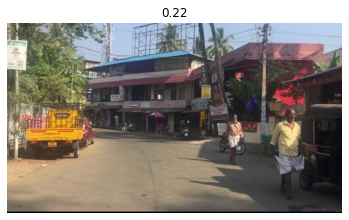

0.76 0.7614457386122079
0.27 : THRESH 

0.65 0.6492276189026439
0.27 : THRESH 

0.61 0.6125873565598803
0.27 : THRESH 

0.57 0.565061355863267
0.27 : THRESH 

0.41 0.41072643525866787
0.27 : THRESH 

0.38 0.3790017507155035
0.27 : THRESH 

0.4 0.404153022248868
0.27 : THRESH 

0.3 0.29991041325009465
0.28 : THRESH 

0.25 0.2535224383683594
0.31 : THRESH 



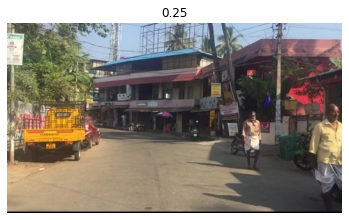

0.74 0.7356604941424418
0.29 : THRESH 

0.57 0.5749637653056966
0.27 : THRESH 

0.58 0.5819153722152509
0.27 : THRESH 

0.52 0.5208345026859978
0.27 : THRESH 

0.39 0.3945392933039966
0.28 : THRESH 

0.42 0.4239136535036643
0.28 : THRESH 

0.35 0.3522294331668549
0.28 : THRESH 

0.41 0.4119267545942548
0.29 : THRESH 

0.34 0.3358583281073728
0.33 : THRESH 

0.35 0.3464465920804572
0.33 : THRESH 

0.38 0.3820100421773415
0.33 : THRESH 

0.36 0.35601121803929053
0.34 : THRESH 

0.35 0.34801465773154144
0.36 : THRESH 



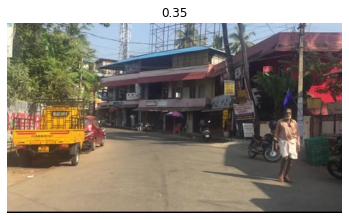

0.65 0.6537087006272716
0.36 : THRESH 

0.63 0.6298892908803867
0.3 : THRESH 

0.55 0.5480703298679451
0.3 : THRESH 

0.51 0.514391935499719
0.3 : THRESH 

0.6 0.597496953456877
0.32 : THRESH 

0.52 0.5186818492031326
0.34 : THRESH 

0.39 0.39400395272609456
0.35 : THRESH 

0.39 0.3930563793472639
0.36 : THRESH 

0.4 0.4019053869356714
0.37 : THRESH 

0.39 0.3880120180596138
0.36 : THRESH 

0.34 0.3435906845126128
0.35 : THRESH 



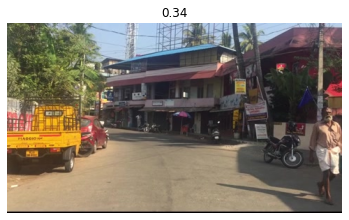

0.73 0.7343741528323336
0.34 : THRESH 

0.79 0.7899017270124786
0.31 : THRESH 

0.67 0.6739474557069611
0.29 : THRESH 

0.61 0.6059925406472727
0.28 : THRESH 

0.53 0.529549718694764
0.3 : THRESH 

0.59 0.5911418374848866
0.32 : THRESH 

0.53 0.5347907488358087
0.34 : THRESH 

0.55 0.547670461745638
0.37 : THRESH 

0.39 0.3889696158226523
0.42 : THRESH 



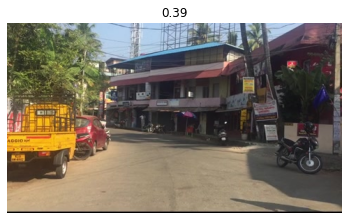

0.5 0.4996142972043139
0.38 : THRESH 

0.62 0.6150038432046737
0.4 : THRESH 

0.55 0.5495732231499638
0.4 : THRESH 



In [95]:
i = 1
final = []
diff = []
comp = images[0]
start, end, max = 0,0,8
while i < len(images) - 1:
  f = sector(cv2.GaussianBlur(hsv(images[i]), (7,7), 0), cv2.GaussianBlur(hsv(comp), (7,7), 0), cv2.HISTCMP_CORREL)
  x = round(f, 2)
  print(x, f)
  if end - start > max:
    start+=1
  try:
    thresh = round((np.mean(diff[start:end]) + 0.4)/2 - np.sqrt(np.var(diff[start:end])), 2)
  except:
    thresh = 0.4
  print(str(thresh) + " : THRESH \n")
  end+=1
  diff.append(x)
  if(x < thresh):
    plt.imshow(images[i])
    plt.title(str(x))
    plt.axis('off')
    plt.show()
    final.append(images[i])
    comp = images[i]
  i+=1

In [ ]:
sfull = []

sector(cv2.GaussianBlur(hsv(images[49]), (5,5), 0), cv2.GaussianBlur(hsv(images[50]), (5,5), 0), cv2.HISTCMP_CORREL)

0.4446270337575359

1.0 1.0
0.9 0.8610973758971197
0.8 0.800806827154346
0.7 0.7210335262731181
0.7 0.7162079499351927
0.7 0.6827926786947823
0.7 0.6889549042883818
0.7 0.66959606235788
0.6 0.6356944848193805
0.7 0.6688051092637601
0.6 0.6086755798464786
0.6 0.6088203842640273
0.7 0.6556554396048512
0.6 0.5984012812676213
0.6 0.6251598249309464
0.7 0.6629714061482895
0.7 0.6523668551890104
0.7 0.6908911706407083
0.6 0.6218276655155295
0.6 0.5703465961231361
0.6 0.6136733150277619
0.6 0.6322429290728974
0.7 0.6839371946684536
0.6 0.6138675611492836
0.7 0.6555995932631927
0.7 0.6568726782036519
0.7 0.6646985562485609
0.6 0.5597842756653226
0.6 0.5938461943455091
0.5 0.5266500194643208
0.6 0.6437899094145713
0.6 0.561922429261733
0.5 0.5430792856010694
0.6 0.6066902365088097
0.6 0.6302590342731729
0.6 0.6150261353136074
0.7 0.6815493343197253
0.6 0.6487580288888574
0.6 0.5873723460003207
0.6 0.6027429407736585
0.6 0.6194297187437914
0.6 0.6149913157010383
0.6 0.6040049289529398
0.6 0.5518688408112646
0.6 0.6

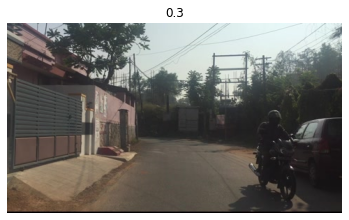

0.7 0.7375270973111449
0.7 0.6921462850428993
0.7 0.6820985158248248
0.6 0.5998637161612811
0.7 0.6749943112280022
0.6 0.5943268502861933
0.6 0.5969788165080707
0.6 0.5904184476214969
0.5 0.5389531302566318
0.5 0.45824070988958954
0.4 0.42462816817521404
0.5 0.5259743535016109
0.5 0.49401655569604536
0.4 0.4270578014259523
0.4 0.39905691255864584
0.4 0.412151621341813
0.4 0.388506269982635
0.4 0.4054692047640522
0.3 0.3343064786974721


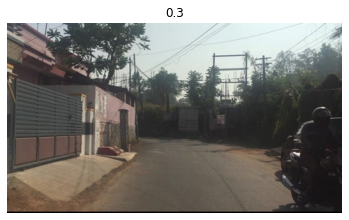

0.7 0.7368088451173161
0.7 0.690891651742803
0.5 0.5205395290836494
0.5 0.5210591462155539
0.5 0.500031075585889
0.5 0.4905440785172983
0.6 0.553714353976571
0.5 0.5256529258934467
0.5 0.4958593355552711
0.5 0.5128624617913792
0.5 0.5104694902961113
0.5 0.49969020350623444
0.5 0.4896332134950801
0.5 0.47623860414529723
0.4 0.4276620882724062
0.4 0.43260566876487333
0.4 0.4136021360975834
0.4 0.3709321675623725
0.4 0.43849965929310125
0.4 0.4262627678425464
0.4 0.41856036765234933
0.4 0.408745893006939
0.4 0.40683105490572685
0.4 0.43769428750220934
0.5 0.4563323851232317
0.4 0.4296735582086754
0.5 0.4739227437230015
0.4 0.43389744056519763
0.4 0.4455534235923099
0.4 0.4300480850803128
0.4 0.4173720747001107
0.4 0.3791905670740949
0.4 0.40849577934585696
0.4 0.4320715868152097
0.4 0.3935157423717917
0.4 0.3959034313362622
0.4 0.3889039372516406
0.4 0.37791771832494564
0.4 0.3849647727704039
0.4 0.4274283337335954
0.4 0.38725738017492145
0.4 0.42793545235479696
0.4 0.37986836544583796
0.

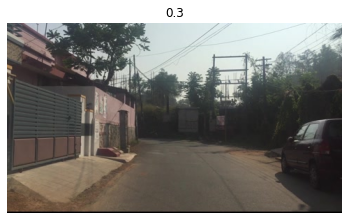

0.8 0.8167199127897616
0.7 0.7377144825392502
0.7 0.6713942886018823
0.7 0.668820804646303
0.6 0.5727419451657694
0.6 0.6254228402401999
0.6 0.6048432228940556
0.6 0.6191408770737273
0.7 0.6610730239377957
0.6 0.6233306127327983
0.6 0.5647574519560622


In [ ]:
i = 1
final = []
comp = images[0]
start, end, max = 0,0,5
while i < len(images) - 1:
  f = sector(cv2.GaussianBlur(hsv(images[i]), (7,7), 0), cv2.GaussianBlur(hsv(comp), (7,7), 0), cv2.HISTCMP_CORREL)
  x = round(f, 1)
  print(x, f)
  thresh = np.avera
  if(x < 0.4):
    plt.imshow(images[i])
    plt.title(str(x))
    plt.axis('off')
    plt.show()
    final.append(images[i])
    comp = images[i]
  i+=1

In [90]:
len(final)

21

In [ ]:
np.average(sfull[0:2])

0.009355371978903545

In [ ]:
sector(images[0], images[99], cv2.HISTCMP_CORREL, 16, True)